## Lecturee-09: Convolutional Neural Networks

### Classification & Localization & Object Detection & Segmentation

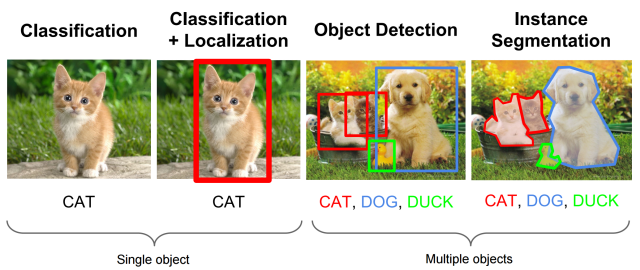

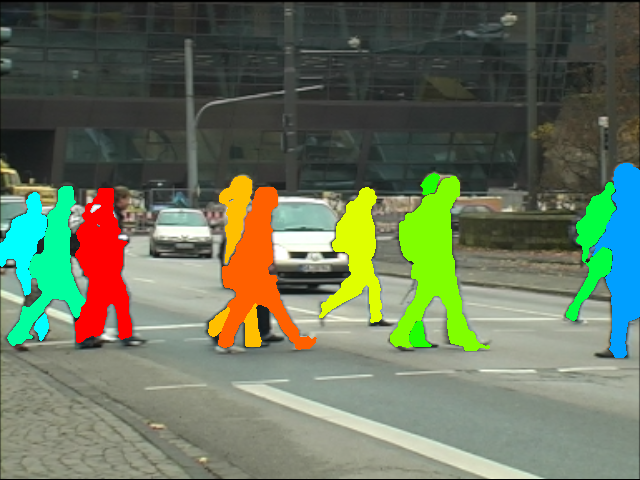

### Tracking

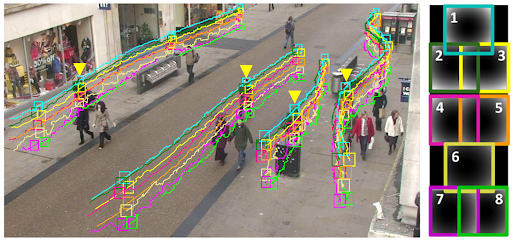

## Style Transfer 

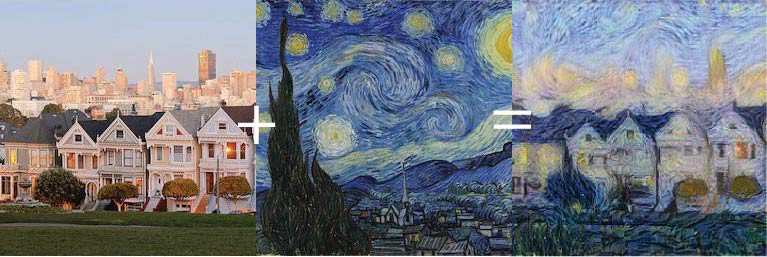

## The difficulties we faced in image problem.

Input is get really big. (128 * 128 * 3), hidden size is small, but the total weight number will be very large.

We need enough data to traning this.

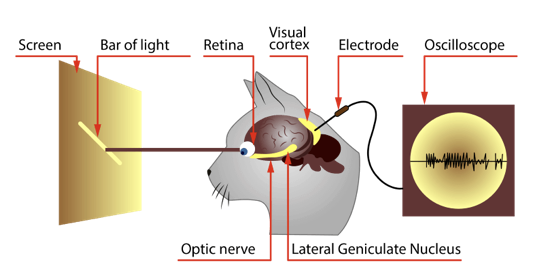

## Edge Dectection 

In [1]:
import numpy as np

In [2]:
import matplotlib.pyplot as plt

In [3]:
simple_image = np.array([
    [3,0,1,2,7,4],
    [1,5,8,9,8,1],
    [2,7,2,5,8,3],
    [0,9,3,1,2,8],
    [4,6,1,6,2,8],
    [2,7,5,2,3,9]
])

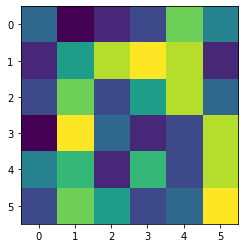

In [4]:
plt.imshow(simple_image)

In [5]:
filter_ = np.array([
    [1, 0, -1],
    [1, 0, -1],
    [1, 0, -1]
])

In [6]:
window_width = filter_.shape[0]
window_height = filter_.shape[1]

filter_result = np.zeros((4, 4))

for h in range(simple_image.shape[0] - window_height + 1):
    for w in range(simple_image.shape[1] - window_width + 1):
        filter_result[h][w] = (np.sum(np.multiply(simple_image[h: h + window_height, w: w + window_width], filter_)))

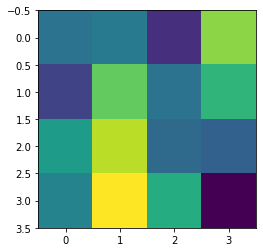

In [7]:
plt.imshow(filter_result)

In [8]:
from PIL import Image

In [9]:
dog_gray = Image.open('dataset/junjie.jpg').convert('L')

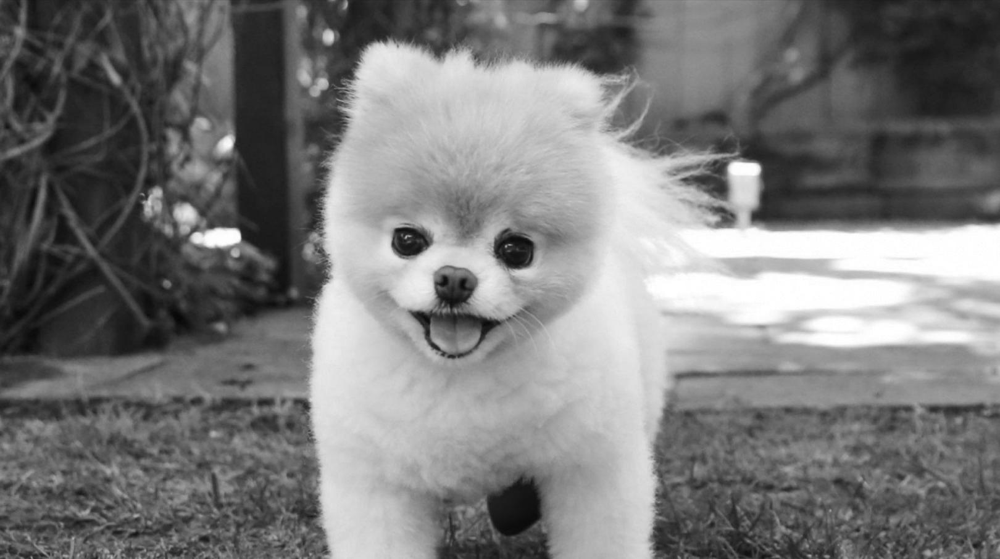

In [10]:
dog_gray

In [11]:
dog_array = np.array(dog_gray)

In [12]:
dog_array.shape

(907, 1620)

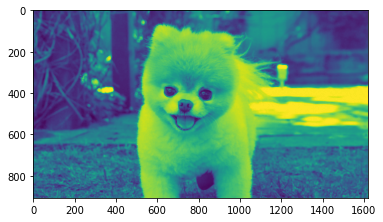

In [13]:
plt.imshow(dog_array)

In [14]:
from collections import defaultdict

In [15]:
window_width = filter_.shape[0]
window_height = filter_.shape[1]

dog_filter_result = np.zeros((dog_array.shape[0] - window_height + 1, dog_array.shape[1] - window_width + 1))

for h in range(dog_array.shape[0] - window_height + 1):
    for w in range(dog_array.shape[1] - window_width + 1):
        window = dog_array[h: h + window_height, w: w + window_width]
        dog_filter_result[h][w] = np.sum(np.multiply(window, filter_))
        
            #print('Wrong Occured in {}, {}'.format(h, w))

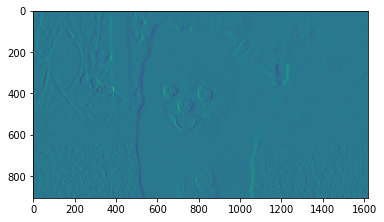

In [16]:
plt.imshow(dog_filter_result)

#### TODO: using colorful image and try different color channel

#### TODO:  We can change to image gray and different channels to observe the function. 

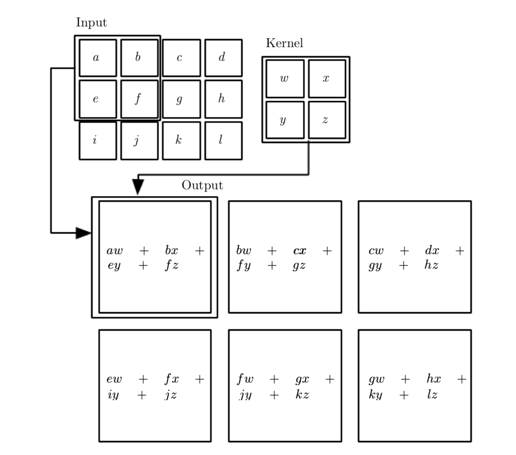

## Why this filter works?

do some math works~

In [17]:
another_filter = np.array([
    [1, 1, 1],
    [0, 0, 0],
    [-1, -1, -1]
])

In [18]:
window_width = another_filter.shape[0]
window_height = another_filter.shape[1]

dog_another_filter_result = np.zeros((dog_array.shape[0] - window_height + 1, dog_array.shape[1] - window_width + 1))

for h in range(dog_array.shape[0] - window_height + 1):
    for w in range(dog_array.shape[1] - window_width + 1):
        window = dog_array[h: h + window_height, w: w + window_width]
        dog_another_filter_result[h][w] = np.sum(np.multiply(window, another_filter))
        
            #print('Wrong Occured in {}, {}'.format(h, w))

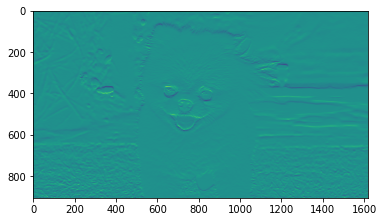

In [19]:
plt.imshow(dog_another_filter_result)

## Different filter could process images to different images. We need tell computer to learn the filters's value by Machine Learning

In [20]:
dog_gray_array = np.array(dog_gray)

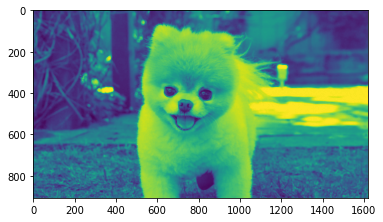

In [21]:
plt.imshow(dog_gray_array)

In [22]:
third_filter = np.random.normal(size=(5, 5)) * 10

In [23]:
window_width = third_filter.shape[0]
window_height = third_filter.shape[1]

dog_third_filter_result = np.zeros((dog_gray_array.shape[0] - window_height + 1, dog_gray_array.shape[1] - window_width + 1))

step_size = 1

for h in range(0, dog_gray_array.shape[0] - window_height + step_size, step_size):
    for w in range(0, dog_gray_array.shape[1] - window_width + step_size, step_size):
        window = dog_gray_array[h: h + window_height, w: w + window_width]
        dog_third_filter_result[h][w] = np.sum(np.multiply(window, third_filter))

In [24]:
window.shape

(5, 5)

In [25]:
third_filter

array([[  7.50175084,  13.32692052,   0.29794067,   1.712294  ,
          8.04671216],
       [-11.84429376,   1.7086238 ,   5.64028382,  -4.62523086,
         12.15878725],
       [ -4.48060068,   1.08481366,   2.70241733,   6.57220383,
          0.64842709],
       [ 14.08326293,  -1.40924077,  -7.76267779,  -6.34422265,
        -11.49941148],
       [  0.59920172,  14.50667212,  -6.19998946, -24.37590649,
          4.77045709]])

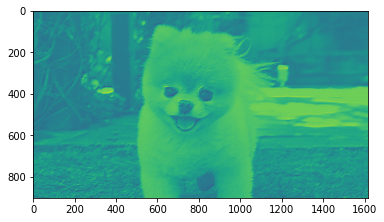

In [26]:
plt.imshow(dog_third_filter_result)

## Review 

1. Filter Functions
2. Filter Size, width, heigth
3. Filter Step
4. Filter Num 

## Padding 

In [27]:
window_width = filter_.shape[0]
window_height = filter_.shape[1]

dog_filter_result = np.zeros((dog_array.shape[0] - window_height + 1, dog_array.shape[1] - window_width + 1))

for h in range(dog_array.shape[0] - window_height + 1):
    for w in range(dog_array.shape[1] - window_width + 1):
        window = dog_array[h: h + window_height, w: w + window_width]
        dog_filter_result[h][w] = np.sum(np.multiply(window, filter_))
        
            #print('Wrong Occured in {}, {}'.format(h, w))

In [28]:
dog_array.shape

(907, 1620)

In [29]:
dog_filter_result.shape

(905, 1618)

In [30]:
??np.pad

In [31]:
dog_array_with_pad = np.pad(dog_gray_array, (1, 1), 'constant')

In [32]:
window_width = filter_.shape[0]
window_height = filter_.shape[1]

dog_filter_result = np.zeros((dog_array_with_pad.shape[0] - window_height + 1, dog_array_with_pad.shape[1] - window_width + 1))

for h in range(dog_array_with_pad.shape[0] - window_height + 1):
    for w in range(dog_array_with_pad.shape[1] - window_width + 1):
        window = dog_array_with_pad[h: h + window_height, w: w + window_width]
        dog_filter_result[h][w] = np.sum(np.multiply(window, filter_))
        
            #print('Wrong Occured in {}, {}'.format(h, w))

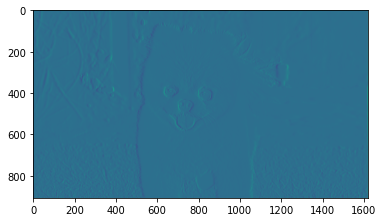

In [33]:
plt.imshow(dog_filter_result)

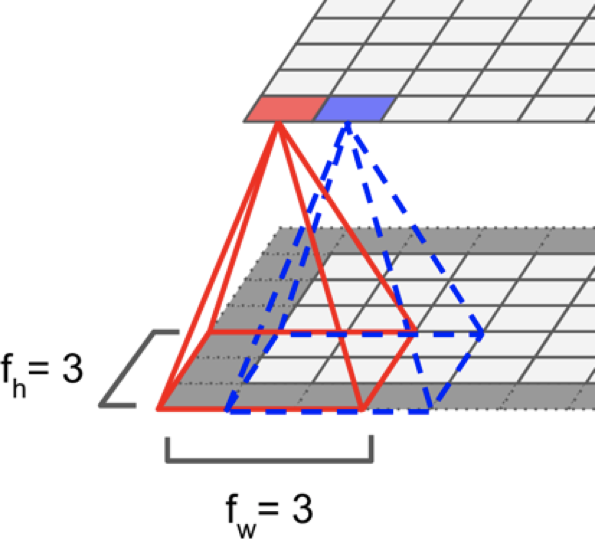

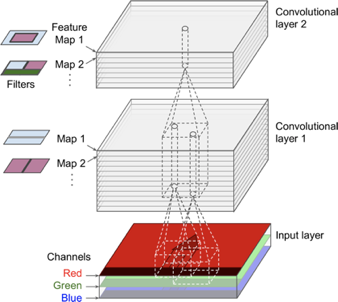

## Padding Functions

1. Avoid image to shrink
2. Use the corner and edge pixels more time

### Valid Convolutional and Same Convolutions (Zero Convolutions)

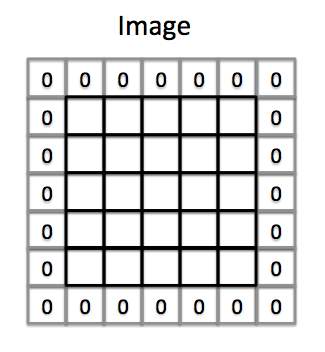

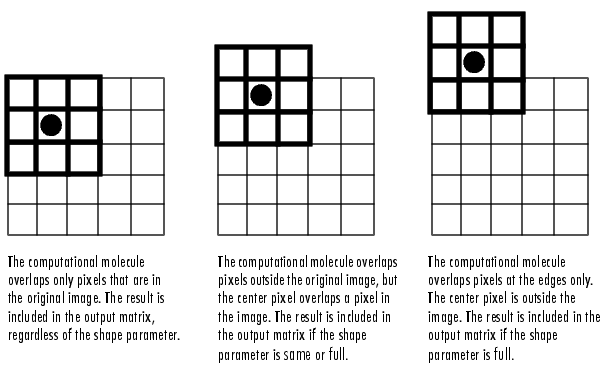

## How to compute the size after padding?

## Stride Step: 
 Compute the output size of Stride, Filter Size, and Padding

## Filter On 3D-Volumn 

In [34]:
dog = Image.open('dataset/junjie.jpg')
dog_array = np.array(dog)

In [35]:
dog_array.shape

(907, 1620, 3)

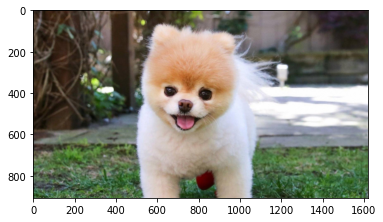

In [36]:
plt.imshow(dog_array)

In [37]:
volumn_filter = np.array([
    [
        [1, 0, -1],
        [1, 0, -1],
        [1, 0, -1]
    ],
    [
        [1, 0, -1],
        [1, 0, -1],
        [1, 0, -1]
    ],
    [
        [1, 0, -1],
        [1, 0, -1],
        [1, 0, -1]
    ]
])

In [38]:
window_width = volumn_filter.shape[1]
window_height = volumn_filter.shape[2]

dog_filter_result = np.zeros((dog_array.shape[0] - window_height + 1, dog_array.shape[1] - window_width + 1))

for h in range(dog_array.shape[0] - window_height + 1):
    for w in range(dog_array.shape[1] - window_width + 1):
        window = dog_array[h: h + window_height, w: w + window_width, :]
        dog_filter_result[h][w] = np.sum(np.multiply(window, volumn_filter))
        
            #print('Wrong Occured in {}, {}'.format(h, w))

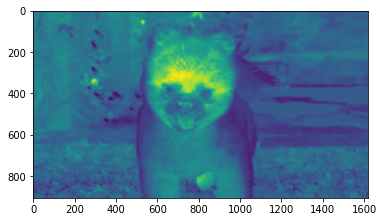

In [39]:
plt.imshow(dog_filter_result)

## What if we want more filters? 

some filters are responsible for horizon line and another responsible for verticle line

some filters are responsible for some other direction

In [40]:
volumn_filter_1 = np.array([
    [
        [1, 0, -1],
        [1, 0, -1],
        [1, 0, -1]
    ],
    [
        [1, 0, -1],
        [1, 0, -1],
        [1, 0, -1]
    ],
    [
        [1, 0, -1],
        [1, 0, -1],
        [1, 0, -1]
    ]
])

In [41]:
volumn_filter_2 = np.array([
    [
        [1, 1, 1],
        [0, 0, 0],
        [-1, -1, -1]
    ],
    [
        [1, 1, 1],
        [0, 0, 0],
        [-1, -1, -1]
    ],
    [
        [1, 1, 1],
        [0, 0, 0],
        [-1, -1, -1]
    ]
])

In [42]:
volumn_filter_3 = np.random.normal((3, 3, 3))

In [43]:
volumn_filter_4 = np.array([
    [
        [0, 1, 0],
        [-1, 0, -1],
        [0, 1, 0]
    ],
    [
        [0, 1, 0],
        [-1, 0, -1],
        [0, 1, 0]
    ],
    [
        [0, 1, 0],
        [-1, 0, -1],
        [0, 1, 0]
    ]
])

In [44]:
filters = [
    volumn_filter_1,
    volumn_filter_2,
    volumn_filter_3,
    volumn_filter_4
]

window_width = filters[0].shape[1]
window_height = filters[0].shape[2]

dog_filter_result = np.zeros((dog_array.shape[0] - window_height + 1, dog_array.shape[1] - window_width + 1, len(filters)))

for fi, f in enumerate(filters):
    volumn_filter = f
    for h in range(dog_array.shape[0] - window_height + 1):
        for w in range(dog_array.shape[1] - window_width + 1):
            window = dog_array[h: h + window_height, w: w + window_width, :]
            # the GPU could accelarte this part!
            dog_filter_result[h][w][fi] = np.sum(np.multiply(window, volumn_filter))
        
            #print('Wrong Occured in {}, {}'.format(h, w))

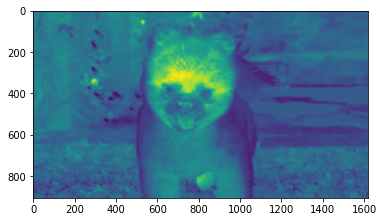

In [45]:
plt.imshow(dog_filter_result[:, :, 0])

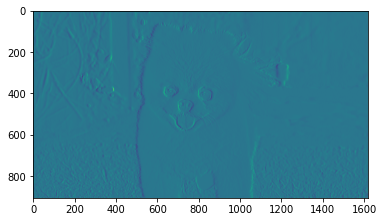

In [46]:
plt.imshow(dog_filter_result[:, :, 1])

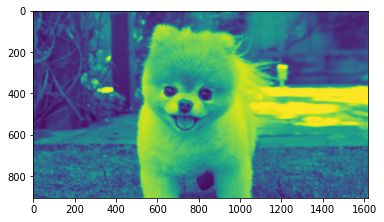

In [47]:
plt.imshow(dog_filter_result[:, :, 2])

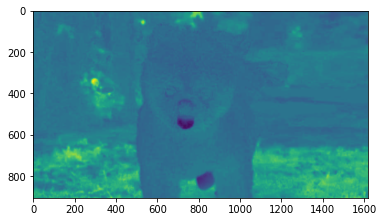

In [48]:
plt.imshow(dog_filter_result[:, :, 3])

### Review: What's the function of filters? 

<html>
<p style="font-size: 50px; color:red;">Important</p>
</html>

## => Paramters Sharing and Location Invariant 

## Pooling Layer

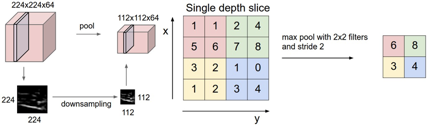

In [49]:
dog_filter_result.shape

(905, 1618, 4)

In [50]:
dog_filter_result[:, :, 0].shape

(905, 1618)

In [51]:
import math

In [52]:
stride_size = 3

pooling_size = (10, 10)
pooling_result = np.zeros((
    math.ceil( (dog_filter_result.shape[0] - pooling_size[0] + 1) / stride_size),
    math.ceil( (dog_filter_result.shape[1] - pooling_size[1] + 1) / stride_size),
    dog_filter_result.shape[2]
))

print(pooling_result.shape)
#pooling_mode = 'max' 
pooling_mode = 'mean'

pooling_funcs = {
    'mean': np.mean,
    'max': np.max
}

for fi in range(dog_filter_result.shape[2]):
    f_result = dog_filter_result[:, :, fi]
    for h in range(0, f_result.shape[0] - pooling_size[0] + 1, stride_size):
        for w in range(0, f_result.shape[1] - pooling_size[1] + 1, stride_size):
            window = f_result[h: h + window_height, w: w + window_width]
            # the GPU could accelarte this part!
            #dog_filter_result[h][w][fi] = np.sum(np.multiply(window, volumn_filter))
            pooling_result[h//stride_size][w//stride_size][fi] = pooling_funcs[pooling_mode](window)

(299, 537, 4)


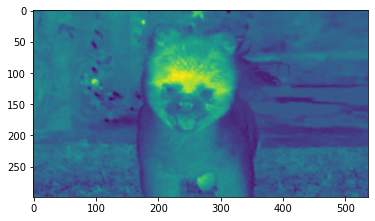

In [53]:
plt.imshow(pooling_result[:, :, 0])

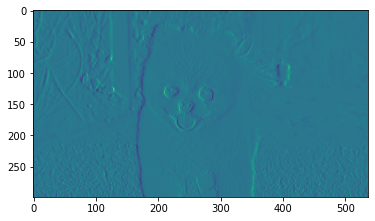

In [54]:
plt.imshow(pooling_result[:, :, 1])

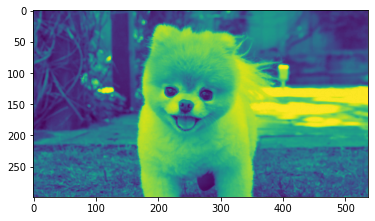

In [55]:
plt.imshow(pooling_result[:, :, 2])

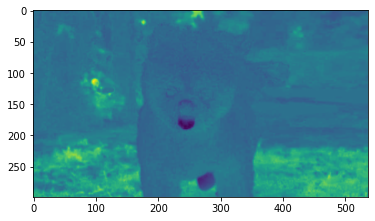

In [56]:
plt.imshow(pooling_result[:, :, 3])

## Summary the dimensions computing 

+ Filter Num 
+ Filter Window Height, Width
+ Stride Size
+ Input Width, Height, Channel
+ Padding Size
+ Pooling Size

## Fully Connected Layer

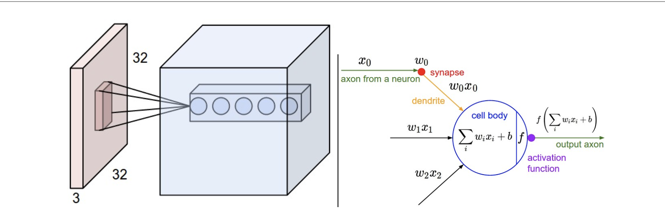

In [57]:
flatten = pooling_result.reshape(1, -1)

In [58]:
flatten.shape

(1, 642252)

## Give Fully Connected Layer to a linear function

In [59]:
class_num = 5

weight = np.random.uniform(size=(flatten.shape[1], class_num))
bias = np.zeros(class_num)

In [60]:
np.matmul(flatten, weight) + bias

array([[7.64935275e+08, 7.67286907e+08, 7.66112403e+08, 7.65446959e+08,
        7.63052279e+08]])

In [61]:
def softmax(inp): 
    inp = inp - np.max(inp)
    
    ep = np.exp(inp)
    
    return ep / np.sum(ep)

In [62]:
softmax(np.matmul(flatten, weight) + bias)

array([[0., 1., 0., 0., 0.]])

## Cross-Entropy

In [63]:
def cross_entropy(ytrues, yhats):
    loss = 0
    
    eps = 1e-10 
    
    for i, y in enumerate(ytrues):
        loss += np.sum(y[j] * np.log((yhats[i][j]) + eps) for j in range(len(y)))
    
    loss *= -1
    
    return loss

In [64]:
cross_entropy([[0, 0, 0, 1, 0]], softmax(np.matmul(flatten, weight) + bias))

/Users/bubble/opt/miniconda3/envs/pytorch/lib/python3.6/site-packages/ipykernel_launcher.py:7: DeprecationWarning: Calling np.sum(generator) is deprecated, and in the future will give a different result. Use np.sum(np.fromiter(generator)) or the python sum builtin instead.
  import sys


23.025850929940457

## A Complete Example

In [65]:
import torchvision

In [66]:
import torch

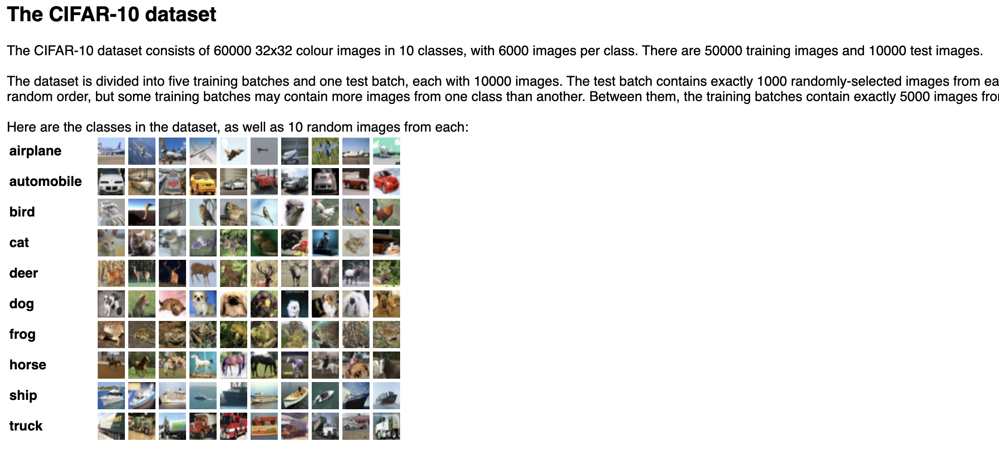

In [67]:
kind_and_index = [
    '飞机',
    '汽车',
    '小鸟',
    '猫咪',
    '小鹿',
    '小狗',
    '青蛙',
    '小马',
    '船舶',
    '卡车'
]

In [68]:
cifar_10 = torchvision.datasets.CIFAR10('.', download=True, transform=torchvision.transforms.ToTensor())

Files already downloaded and verified


In [69]:
cifar_10_test = torchvision.datasets.CIFAR10('.', download=True, train=False, transform=torchvision.transforms.ToTensor())

Files already downloaded and verified


In [70]:
len(cifar_10_test)

10000

In [71]:
cifar_10[0][0].shape

torch.Size([3, 32, 32])

## Split Train and validation

In [72]:
from torch.utils.data import random_split

In [73]:
cifar_2 = [(data, label) for data, label in cifar_10 if label in [3, 4]]

In [74]:
train, validation = random_split(cifar_10, lengths=( 
                                                    int(len(cifar_10) * 0.9), 
                                                    int(len(cifar_10) * 0.1))
                                )

In [75]:
train_loader = torch.utils.data.DataLoader(train,
                                          batch_size=512,
                                          shuffle=True)

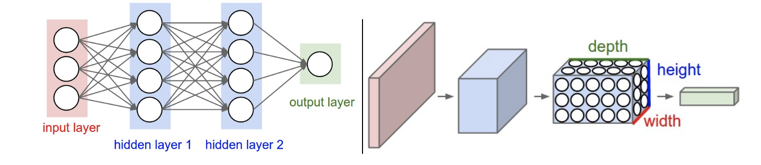

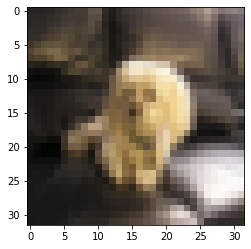

In [76]:
plt.imshow(train[9][0].permute(1, 2, 0))

In [77]:
train[0][0].shape

torch.Size([3, 32, 32])

In [78]:
??torch.nn.Conv2d

In [79]:
conv = torch.nn.Conv2d(3, 16, kernel_size=3)

In [80]:
conv

Conv2d(3, 16, kernel_size=(3, 3), stride=(1, 1))

In [81]:
conv.weight

Parameter containing:
tensor([[[[-0.0301,  0.0220, -0.1337],
          [ 0.0377,  0.1416, -0.1698],
          [ 0.0178,  0.1461, -0.0701]],

         [[ 0.0751,  0.1127, -0.1613],
          [-0.1399, -0.0911,  0.0797],
          [-0.1903,  0.1786, -0.1486]],

         [[-0.0243, -0.1687,  0.0102],
          [-0.0112,  0.0359,  0.0155],
          [ 0.1889, -0.0548,  0.0708]]],


        [[[ 0.1070, -0.0653,  0.1489],
          [-0.0920, -0.0613, -0.1075],
          [-0.1758, -0.1742,  0.0566]],

         [[-0.0657,  0.1295,  0.0162],
          [-0.1314,  0.1018,  0.1426],
          [-0.0037, -0.1652,  0.0481]],

         [[ 0.0592, -0.0394,  0.1324],
          [-0.1347,  0.1357, -0.0084],
          [-0.0303, -0.1239, -0.1262]]],


        [[[-0.0584,  0.1190, -0.0255],
          [ 0.1390, -0.1686, -0.1137],
          [-0.1444, -0.0123,  0.1827]],

         [[ 0.0350, -0.1304, -0.1241],
          [-0.0208, -0.0324,  0.1048],
          [ 0.0492,  0.0309,  0.0203]],

         [[-0.0676, -0

In [82]:
torch.tensor(np.array(cifar_10[7][0])).unsqueeze(0).shape

torch.Size([1, 3, 32, 32])

In [83]:
conv.bias

Parameter containing:
tensor([ 0.0849, -0.1907,  0.0687, -0.1813, -0.1528, -0.0608, -0.0498, -0.0568,
        -0.1057,  0.0101,  0.1654, -0.1665, -0.1888, -0.0892,  0.0992, -0.1605],
       requires_grad=True)

In [84]:
img = train[0][0]

In [85]:
output = conv(img.unsqueeze(0))

In [86]:
output

tensor([[[[-0.0583, -0.0114, -0.0794,  ..., -0.0160, -0.0163, -0.0200],
          [-0.0310,  0.0049, -0.0911,  ..., -0.0803, -0.0453, -0.0365],
          [-0.0278,  0.0328, -0.0839,  ..., -0.0489, -0.0391, -0.0033],
          ...,
          [-0.0757, -0.0628, -0.0291,  ..., -0.0561, -0.0539, -0.0614],
          [-0.0619, -0.0780, -0.0285,  ..., -0.0481, -0.0566, -0.0534],
          [-0.0708, -0.0930, -0.0423,  ..., -0.0500, -0.0550, -0.0563]],

         [[-0.2995, -0.3224, -0.3164,  ..., -0.3424, -0.4397, -0.4656],
          [-0.3122, -0.3655, -0.2916,  ..., -0.3582, -0.3559, -0.3955],
          [-0.3208, -0.3599, -0.2740,  ..., -0.4500, -0.4510, -0.4815],
          ...,
          [-0.4440, -0.4462, -0.4715,  ..., -0.4167, -0.4066, -0.4089],
          [-0.4848, -0.4549, -0.4902,  ..., -0.4400, -0.4398, -0.4406],
          [-0.4947, -0.4684, -0.5142,  ..., -0.4510, -0.4688, -0.4638]],

         [[-0.1034, -0.0714,  0.0428,  ..., -0.1265, -0.1525, -0.1668],
          [-0.0614, -0.0090, -

In [87]:
output.shape

torch.Size([1, 16, 30, 30])

In [88]:
output[0].shape[0]

16

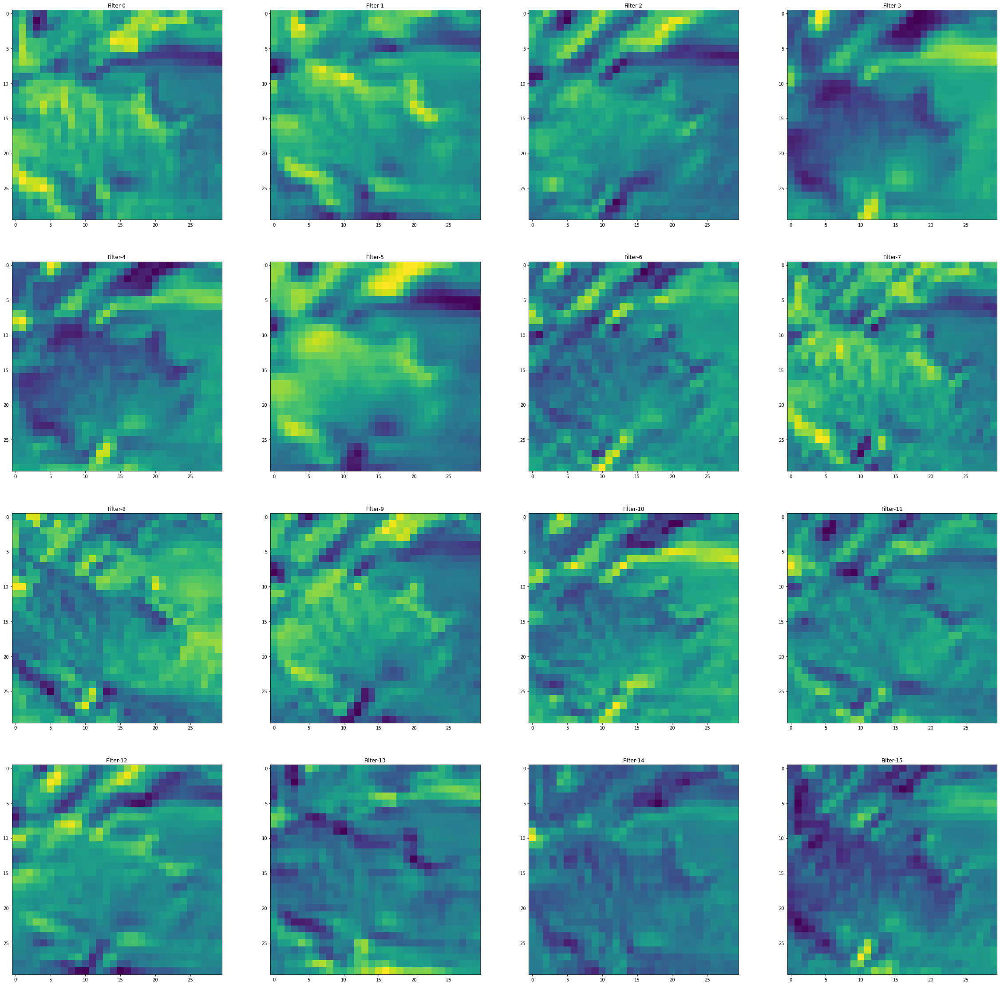

In [89]:
width = 4

fig, ax = plt.subplots(output[0].shape[0]//width, width, figsize=(40, 40))

for i in range(output[0].shape[0]):
    ix = np.unravel_index(i, ax.shape)
    plt.sca(ax[ix])
    ax[ix].title.set_text('Filter-{}'.format(i))
    #plt.scatter(x[:, i], target)
    #plt.scatter(x[:, i], regression.predict(x))
    plt.imshow(output[0][i].detach())

In [90]:
conv = torch.nn.Conv2d(3, 1, kernel_size=3, padding=1)

In [91]:
output = conv(img.unsqueeze(0))

In [92]:
img.unsqueeze(0).shape, output.shape

(torch.Size([1, 3, 32, 32]), torch.Size([1, 1, 32, 32]))

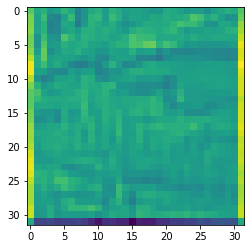

In [93]:
plt.imshow(output[0][0].detach())

### we also could set weights by hands in pytorch

In [94]:
conv = torch.nn.Conv2d(3, 1, kernel_size=3, padding=1)

In [95]:
with torch.no_grad():
    conv.weight[:] = torch.tensor([
        [1, 1, 1],
        [0, 0, 0],
        [-1, -1, -1]
    ])
    
    conv.bias.zero_()

In [96]:
output = conv(img.unsqueeze(0))

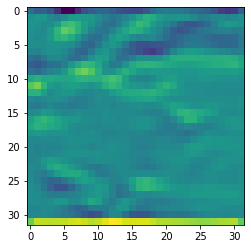

In [97]:
plt.imshow(output[0][0].detach())

In [98]:
pool = torch.nn.MaxPool2d(2)
output = pool(img.unsqueeze(0))

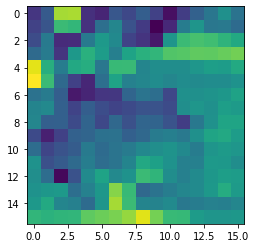

In [99]:
plt.imshow(output[0][0].detach())

In [100]:
from torch import nn
import torch.nn.functional as F

In [101]:
class ConvNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 16, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(16, 8, kernel_size=3, padding=1)
        self.relu = nn.ReLU()
        self.fc1 = nn.Linear(8 * 8 * 8, 32)
        self.fc2 = nn.Linear(32, 10)
 #       self.softmax = nn.Softmax()

    def forward(self, x):
        """
            Notice here, for pytorch pool function:
            - kernel_size – the size of the window to take a max over
            - stride – the stride of the window. Default value is kernel_size
        """
        out = F.max_pool2d(self.relu(self.conv1(x)), 2)
        out = F.max_pool2d(self.relu(self.conv2(out)), 2)
        
        #print('after 2end pool the out shape = {}'.format(out.shape))
        out = out.view(-1, 8 * 8 * 8)
        #print('after view the shape = {}'.format(out.shape))
        out = torch.tanh(self.fc1(out))
        out = self.fc2(out)
  #      out = self.softmax(out)
        return out

In [102]:
class ResNet(nn.Module):
    def __init__(self):
        super().__init__()
        self.conv1 = nn.Conv2d(3, 32, kernel_size=3, padding=1)
        self.conv2 = nn.Conv2d(32, 8, kernel_size=3, padding=1)
        self.conv3 = nn.Conv2d(8, 8, kernel_size=3, padding=1)
        
        self.relu = nn.ReLU()
        
        self.fc1 = nn.Linear(4 * 4 * 8, 32)
        
        self.fc2 = nn.Linear(32, 10)
    #    self.softmax = nn.Softmax()

    def forward(self, x):
        """
            Notice here, for pytorch pool function:
            - kernel_size – the size of the window to take a max over
            - stride – the stride of the window. Default value is kernel_size
        """
        out = F.max_pool2d(self.relu(self.conv1(x)), 2)
        out = F.max_pool2d(self.relu(self.conv2(out)), 2)
        res = out
        out = F.max_pool2d(self.relu(self.conv3(out)) + res, 2)
    
        #print('after 2end pool the out shape = {}'.format(out.shape))
        out = out.view(-1, 4 * 4 * 8)
        #print('after view the shape = {}'.format(out.shape))
        out = torch.tanh(self.fc1(out))
        out = self.fc2(out)
     #   out = self.softmax(out)
        return out

In [103]:
class ResBlock(nn.Module):
    def __init__(self, n_chans):
        super(ResBlock, self).__init__()
        self.conv = nn.Conv2d(n_chans, n_chans, kernel_size=3, padding=1, bias=False)
        self.batch_normal = nn.BatchNorm2d(num_features=n_chans)
        torch.nn.init.kaiming_normal_(self.conv.weight, nonlinearity='relu')
        torch.nn.init.constant_(self.batch_normal.weight, 0.5)
        torch.nn.init.zeros_(self.batch_normal.bias)
        
    def forward(self, x):
        out = self.conv(x)
        out = self.batch_normal(out)
        out = torch.relu(out)
        
        return out + x

In [104]:
class NetResDeep(nn.Module):
    def __init__(self, n_chans=32, n_blacks=10):
        super().__init__()
        
        self.n_chans = n_chans
        self.conv = nn.Conv2d(3, n_chans, kernel_size=3, padding=1)
        
        self.resblocks = nn.Sequential(
            *[ResBlock(n_chans=n_chans) for _  in range(n_blacks)]
        )
        
        self.fc1 = nn.Linear(8 * 8 * n_chans, 32)
        
        self.fc2 = nn.Linear(32, 10)
        
    def forward(self, x):
        out = F.max_pool2d(torch.relu(self.conv(x)), 2)
        out = self.resblocks(out)
        
        out = F.max_pool2d(out, 2)
        
        out = out.view(-1, 8 * 8 * self.n_chans)
        out = torch.relu(self.fc1(out))
        
        out = self.fc2(out)
        
        return out

In [105]:
from torch import optim

In [106]:
#model = ConvNet()
res_model = ResNet()
deep_res_model = NetResDeep()
loss_fn = nn.CrossEntropyLoss()
optimizer = optim.SGD(params=res_model.parameters(), lr=1e-3)

In [108]:
res_model(train[0][0].unsqueeze(0))

tensor([[-0.0780,  0.0298,  0.0172,  0.0567, -0.1020, -0.0739, -0.2467,  0.0291,
         -0.0342,  0.0263]], grad_fn=<AddmmBackward>)

#### notice: we also could use torch.nn.NLLoss, which combine softmax and cross-entropy together. 

In [110]:
losses = []

epochs = 50

for epoch in range(epochs):
    loss_train = 0
    for i, (imgs, labels) in enumerate(train_loader):
        
        outputs = res_model(imgs)
        
        loss = loss_fn(outputs, labels)
        
        optimizer.zero_grad()
        
        loss.backward()
        
        optimizer.step()
        
        loss_train += loss.item()
        
        if i > 0 and i % 10 == 0:
            print('Epoch: {}, batch: {}'.format(epoch, i))
            print('-- loss: {}'.format(loss_train / i))
            
    losses.append(loss_train / len(train_loader))

Epoch: 0, batch: 10
-- loss: 2.533732533454895
Epoch: 0, batch: 20
-- loss: 2.4187185406684875
Epoch: 0, batch: 30
-- loss: 2.3800597349802652
Epoch: 0, batch: 40
-- loss: 2.361067456007004
Epoch: 0, batch: 50
-- loss: 2.3497167587280274
Epoch: 0, batch: 60
-- loss: 2.341775532563527
Epoch: 0, batch: 70
-- loss: 2.3363752467291694
Epoch: 0, batch: 80
-- loss: 2.3321586191654204
Epoch: 1, batch: 10
-- loss: 2.532411980628967
Epoch: 1, batch: 20
-- loss: 2.416080915927887
Epoch: 1, batch: 30
-- loss: 2.378341062863668
Epoch: 1, batch: 40
-- loss: 2.3601625680923464
Epoch: 1, batch: 50
-- loss: 2.3490154266357424
Epoch: 1, batch: 60
-- loss: 2.3414695064226785
Epoch: 1, batch: 70
-- loss: 2.336006018093654
Epoch: 1, batch: 80
-- loss: 2.3320112764835357
Epoch: 2, batch: 10
-- loss: 2.532058572769165
Epoch: 2, batch: 20
-- loss: 2.4174431681632997
Epoch: 2, batch: 30
-- loss: 2.3788064161936444
Epoch: 2, batch: 40
-- loss: 2.359369307756424
Epoch: 2, batch: 50
-- loss: 2.348401279449463
Ep

Epoch: 21, batch: 40
-- loss: 2.354554307460785
Epoch: 21, batch: 50
-- loss: 2.342998342514038
Epoch: 21, batch: 60
-- loss: 2.335330438613892
Epoch: 21, batch: 70
-- loss: 2.3299452917916432
Epoch: 21, batch: 80
-- loss: 2.325828677415848
Epoch: 22, batch: 10
-- loss: 2.525434947013855
Epoch: 22, batch: 20
-- loss: 2.410776233673096
Epoch: 22, batch: 30
-- loss: 2.3737561305363974
Epoch: 22, batch: 40
-- loss: 2.3550194799900055
Epoch: 22, batch: 50
-- loss: 2.343307294845581
Epoch: 22, batch: 60
-- loss: 2.335330601533254
Epoch: 22, batch: 70
-- loss: 2.3295677389417375
Epoch: 22, batch: 80
-- loss: 2.32542037665844
Epoch: 23, batch: 10
-- loss: 2.52697594165802
Epoch: 23, batch: 20
-- loss: 2.4118077516555787
Epoch: 23, batch: 30
-- loss: 2.373351216316223
Epoch: 23, batch: 40
-- loss: 2.353712421655655
Epoch: 23, batch: 50
-- loss: 2.342151789665222
Epoch: 23, batch: 60
-- loss: 2.3344048659006753
Epoch: 23, batch: 70
-- loss: 2.328920647076198
Epoch: 23, batch: 80
-- loss: 2.3249

Epoch: 42, batch: 50
-- loss: 2.330376133918762
Epoch: 42, batch: 60
-- loss: 2.3228424231211346
Epoch: 42, batch: 70
-- loss: 2.3174044609069826
Epoch: 42, batch: 80
-- loss: 2.3135140985250473
Epoch: 43, batch: 10
-- loss: 2.511250066757202
Epoch: 43, batch: 20
-- loss: 2.397620403766632
Epoch: 43, batch: 30
-- loss: 2.3597904523213704
Epoch: 43, batch: 40
-- loss: 2.3409352958202363
Epoch: 43, batch: 50
-- loss: 2.329577307701111
Epoch: 43, batch: 60
-- loss: 2.3220478614171345
Epoch: 43, batch: 70
-- loss: 2.3168545620782033
Epoch: 43, batch: 80
-- loss: 2.3127605468034744
Epoch: 44, batch: 10
-- loss: 2.5133909225463866
Epoch: 44, batch: 20
-- loss: 2.39833402633667
Epoch: 44, batch: 30
-- loss: 2.3600764671961465
Epoch: 44, batch: 40
-- loss: 2.340616738796234
Epoch: 44, batch: 50
-- loss: 2.329091634750366
Epoch: 44, batch: 60
-- loss: 2.321647588411967
Epoch: 44, batch: 70
-- loss: 2.3161102771759032
Epoch: 44, batch: 80
-- loss: 2.3120116740465164
Epoch: 45, batch: 10
-- loss:

## Train with deep ResNet

In [111]:
losses = []

epochs = 50

for epoch in range(epochs):
    loss_train = 0
    for i, (imgs, labels) in enumerate(train_loader):
        
        outputs = deep_res_model(imgs)
        
        loss = loss_fn(outputs, labels)
        
        optimizer.zero_grad()
        
        loss.backward()
        
        optimizer.step()
        
        loss_train += loss.item()
        
        if i > 0 and i % 50 == 0:
            print('Epoch: {}, batch: {}'.format(epoch, i))
            print('-- loss: {}'.format(loss_train / i))
            
    losses.append(loss_train / len(train_loader))

Epoch: 0, batch: 50
-- loss: 2.6954475975036623
Epoch: 1, batch: 50
-- loss: 2.6975137519836427
Epoch: 2, batch: 50
-- loss: 2.6977687311172485
Epoch: 3, batch: 50
-- loss: 2.7019530296325684
Epoch: 4, batch: 50
-- loss: 2.7010765218734742
Epoch: 5, batch: 50
-- loss: 2.6969896364212036
Epoch: 6, batch: 50
-- loss: 2.703736004829407
Epoch: 7, batch: 50
-- loss: 2.6986745500564577
Epoch: 8, batch: 50
-- loss: 2.6960340261459352
Epoch: 9, batch: 50
-- loss: 2.695207772254944
Epoch: 10, batch: 50
-- loss: 2.6967294788360596
Epoch: 11, batch: 50
-- loss: 2.6973136615753175
Epoch: 12, batch: 50
-- loss: 2.6958052921295166
Epoch: 13, batch: 50
-- loss: 2.7007604455947876
Epoch: 14, batch: 50
-- loss: 2.6972899198532105
Epoch: 15, batch: 50
-- loss: 2.696777415275574
Epoch: 16, batch: 50
-- loss: 2.693744659423828
Epoch: 17, batch: 50
-- loss: 2.694795651435852
Epoch: 18, batch: 50
-- loss: 2.7001291418075564
Epoch: 19, batch: 50
-- loss: 2.7012630558013915
Epoch: 20, batch: 50
-- loss: 2.702

In [112]:
model = res_model

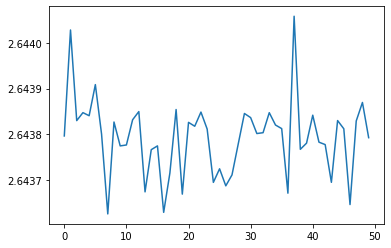

In [113]:
plt.plot(losses)

In [114]:
!mkdir 'model_persist'

mkdir: model_persist: File exists


In [115]:
data_path = 'model_persist'

In [116]:
torch.save(model.state_dict(), data_path + 'cifar_10_model.pt')

In [117]:
load_model = ResNet()

In [118]:
load_model.load_state_dict(
    torch.load(data_path+'cifar_10_model.pt')
)

<All keys matched successfully>

In [119]:
cifar_10_test[99][0]

tensor([[[0.9176, 0.9333, 0.9373,  ..., 0.9647, 0.9725, 0.9765],
         [0.8980, 0.9098, 0.9137,  ..., 0.9569, 0.9647, 0.9725],
         [0.9059, 0.9137, 0.9137,  ..., 0.9804, 0.9843, 0.9882],
         ...,
         [0.4510, 0.4196, 0.4157,  ..., 0.8863, 0.8314, 0.8510],
         [0.4431, 0.4039, 0.3882,  ..., 0.8431, 0.8078, 0.8118],
         [0.4157, 0.4118, 0.4039,  ..., 0.7961, 0.8353, 0.7804]],

        [[0.9137, 0.9294, 0.9333,  ..., 0.9569, 0.9647, 0.9725],
         [0.8941, 0.9059, 0.9098,  ..., 0.9490, 0.9569, 0.9647],
         [0.9020, 0.9098, 0.9098,  ..., 0.9725, 0.9765, 0.9843],
         ...,
         [0.2941, 0.2824, 0.2784,  ..., 0.7765, 0.6902, 0.7098],
         [0.2902, 0.2745, 0.2706,  ..., 0.7490, 0.7137, 0.6941],
         [0.2784, 0.2824, 0.2824,  ..., 0.6980, 0.7569, 0.6980]],

        [[0.9333, 0.9451, 0.9490,  ..., 0.9686, 0.9765, 0.9843],
         [0.9137, 0.9255, 0.9294,  ..., 0.9608, 0.9686, 0.9725],
         [0.9255, 0.9333, 0.9333,  ..., 0.9804, 0.9843, 0.

In [120]:
kind_and_index[torch.argmax(load_model(cifar_10_test[89][0].unsqueeze(0)))]

'飞机'

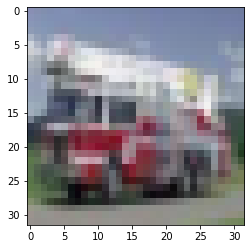

In [121]:
plt.imshow(cifar_10_test[89][0].permute((1, 2, 0)))

In [122]:
kind_and_index[torch.argmax(load_model(cifar_10_test[132][0].unsqueeze(0)))]

'飞机'

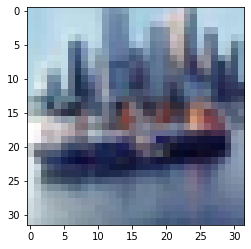

In [123]:
plt.imshow(cifar_10_test[132][0].permute((1, 2, 0)))

In [124]:
kind_and_index[torch.argmax(load_model(cifar_10_test[111][0].unsqueeze(0)))]

'飞机'

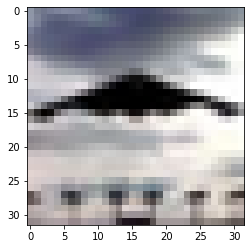

In [125]:
plt.imshow(cifar_10_test[111][0].permute((1, 2, 0)))

In [126]:
unknow = Image.open('dataset/unknow.jpeg')

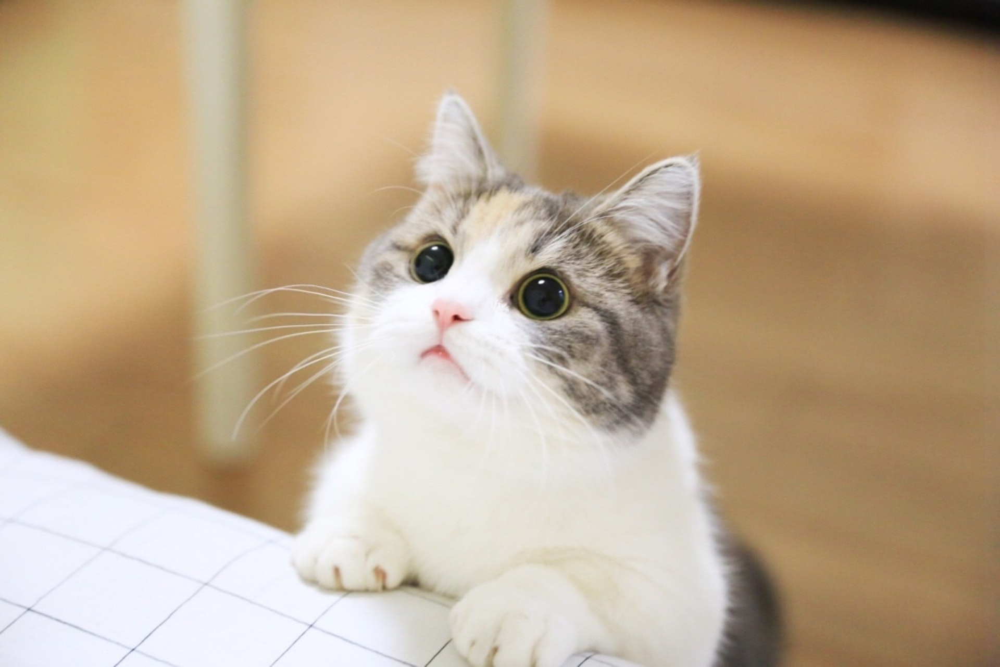

In [127]:
unknow

In [128]:
unknow = unknow.resize((32, 32))

In [129]:
unknow_data = np.array(unknow)

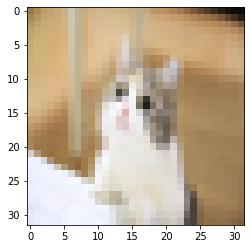

In [130]:
plt.imshow(unknow)

In [131]:
probs = load_model(torch.Tensor(np.array(unknow)).permute(2, 0, 1).unsqueeze(0))

In [132]:
probs

tensor([[ 0.9801, -0.1207, -0.8058, -0.2187, -0.2418,  0.0241, -1.1013, -0.3757,
         -0.3098, -0.4054]], grad_fn=<AddmmBackward>)

In [133]:
kind_and_index[torch.argmax(probs)]

'飞机'

In [134]:
unknow_output_layer_01 = load_model.conv1(torch.Tensor(np.array(unknow)).permute(2, 0, 1).unsqueeze(0))

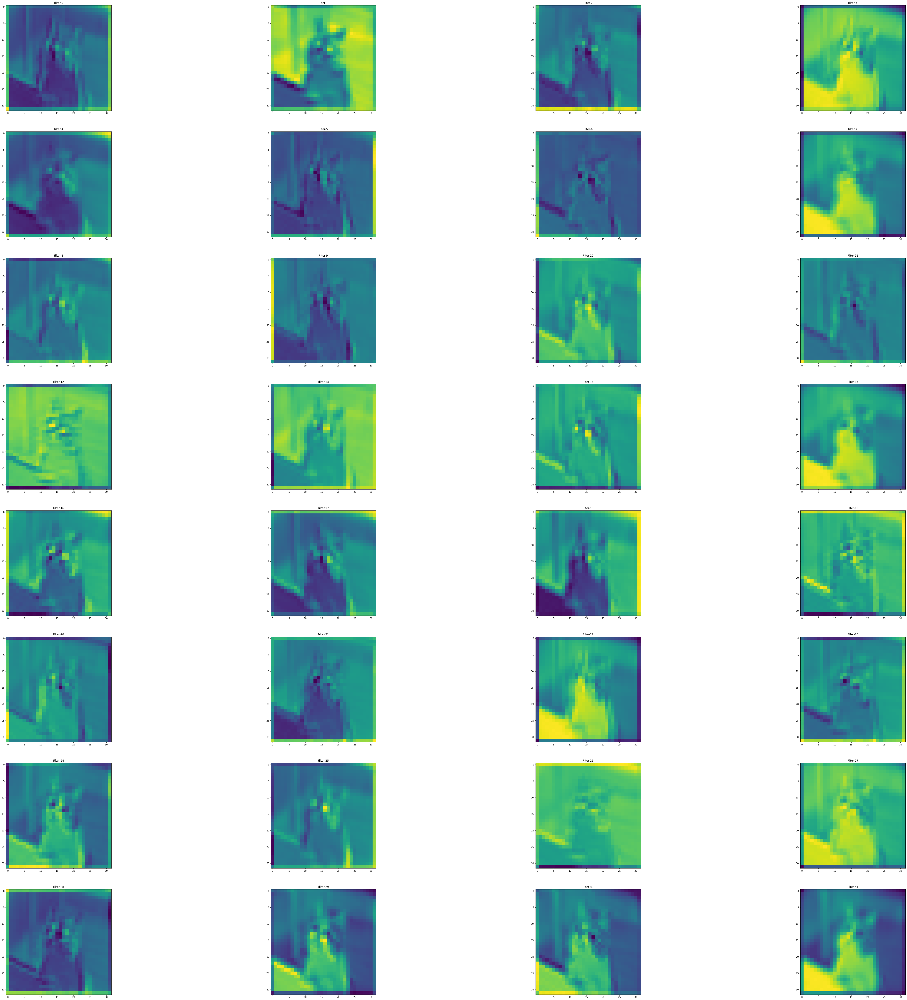

In [135]:
width = 4

fig, ax = plt.subplots(unknow_output_layer_01[0].shape[0]//width, width, figsize=(80, 80))

for i in range(unknow_output_layer_01[0].shape[0]):
    ix = np.unravel_index(i, ax.shape)
    plt.sca(ax[ix])
    ax[ix].title.set_text('Filter-{}'.format(i))
    #plt.scatter(x[:, i], target)
    #plt.scatter(x[:, i], regression.predict(x))
    plt.imshow(unknow_output_layer_01[0][i].detach())

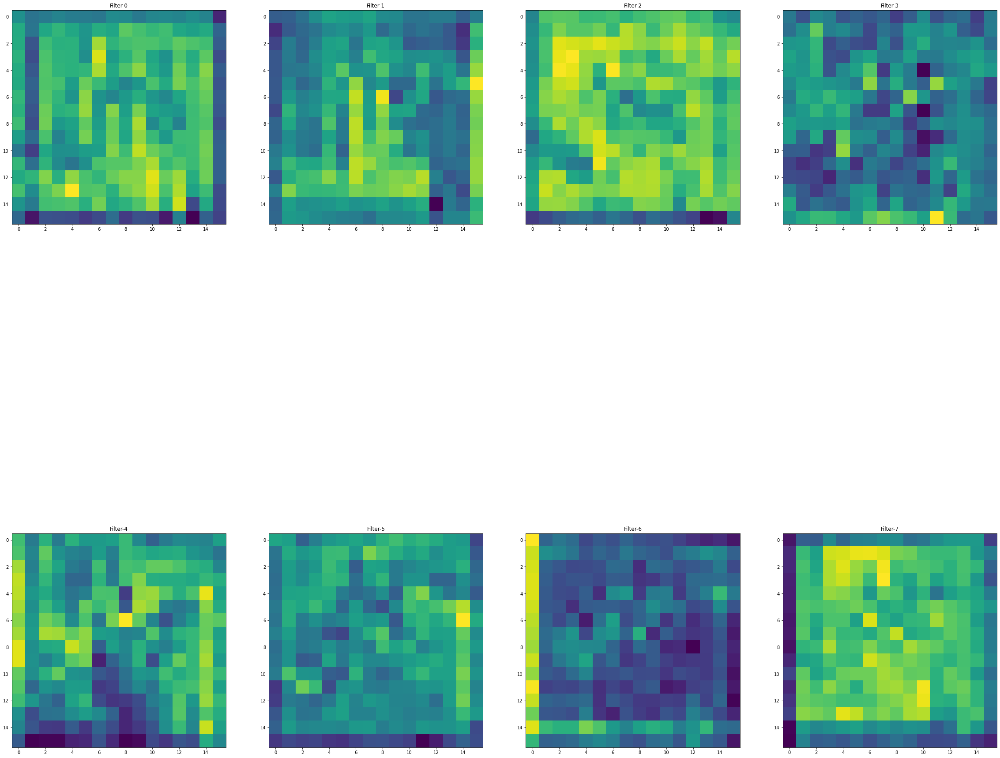

In [136]:
x = torch.Tensor(np.array(unknow)).permute(2, 0, 1).unsqueeze(0)

unknow_output_layer_01 = F.max_pool2d(torch.tanh(model.conv1(x)), 2)
unknow_output_layer_02 = model.conv2(unknow_output_layer_01)

width = 4

fig, ax = plt.subplots(unknow_output_layer_02[0].shape[0]//width, width, figsize=(40, 40))

for i in range(unknow_output_layer_02[0].shape[0]):
    ix = np.unravel_index(i, ax.shape)
    plt.sca(ax[ix])
    ax[ix].title.set_text('Filter-{}'.format(i))
    #plt.scatter(x[:, i], target)
    #plt.scatter(x[:, i], regression.predict(x))
    plt.imshow(unknow_output_layer_02[0][i].detach())

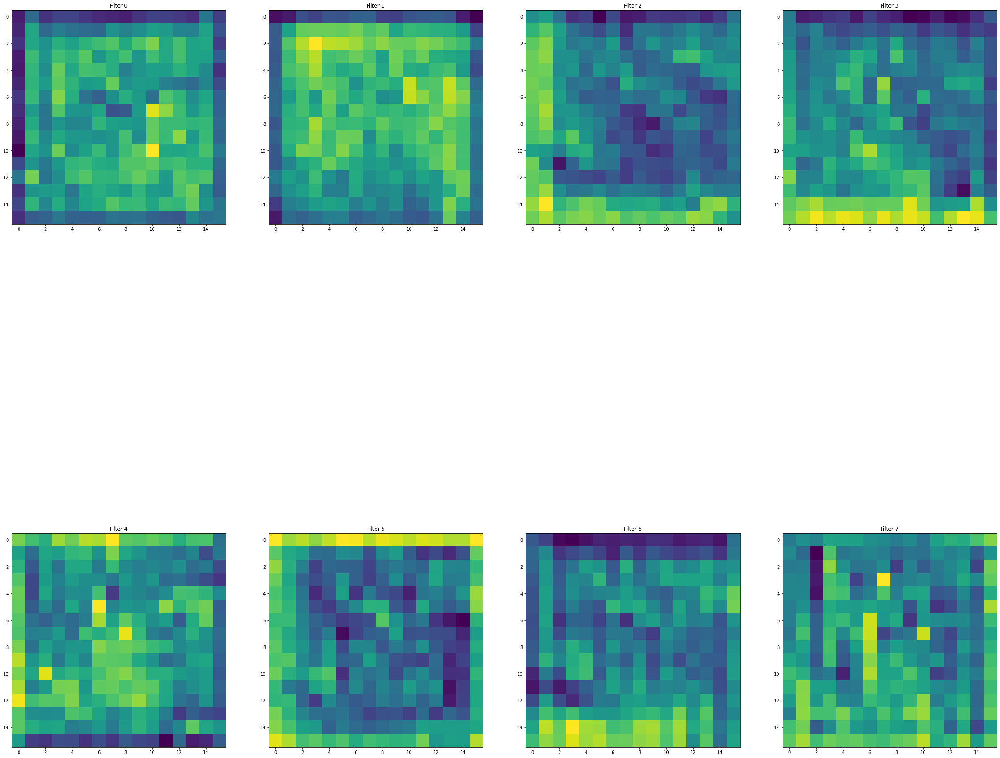

In [137]:
x = torch.Tensor(np.array(unknow)).permute(2, 0, 1).unsqueeze(0)

unknow_output_layer_01 = F.max_pool2d(torch.tanh(model.conv1(x)), 2)
unknow_output_layer_02 = model.conv2(unknow_output_layer_01)
unknow_output_layer_03 = model.conv3(unknow_output_layer_02)

width = 4

fig, ax = plt.subplots(unknow_output_layer_03[0].shape[0]//width, width, figsize=(40, 40))

for i in range(unknow_output_layer_03[0].shape[0]):
    ix = np.unravel_index(i, ax.shape)
    plt.sca(ax[ix])
    ax[ix].title.set_text('Filter-{}'.format(i))
    #plt.scatter(x[:, i], target)
    #plt.scatter(x[:, i], regression.predict(x))
    plt.imshow(unknow_output_layer_03[0][i].detach())

## Dropout Layer

## The Revolution of CNN architectures

### typical convolutional neural networks

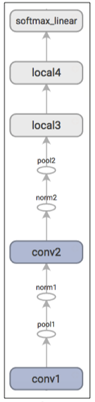

### LeNet
#### > Yan LeCun in 1998 used for hand written digit recognition.

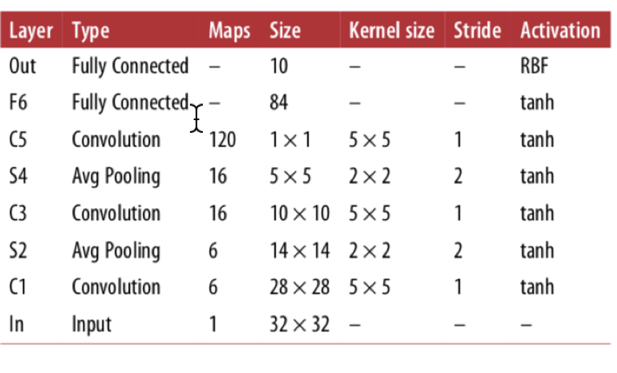

## Alex Net

#### > 2012 Image Net

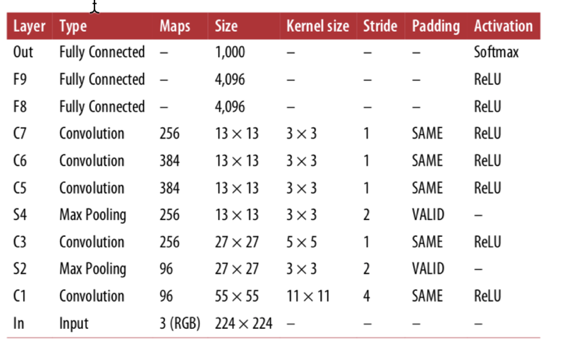

## VGG

#### > 2014, The First Real Deep Neural Networks

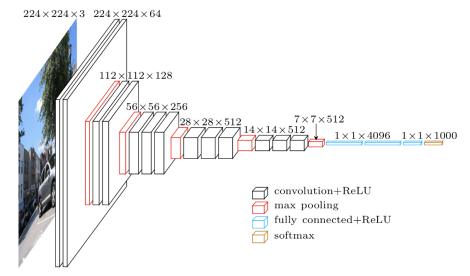

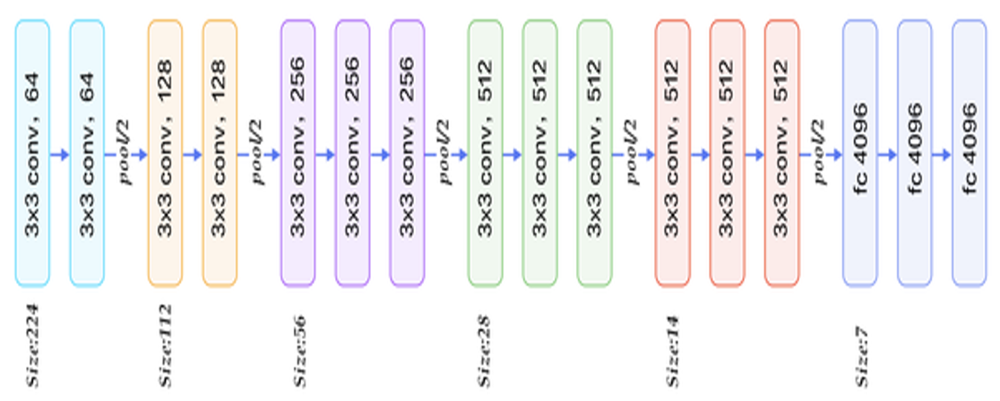

## GoogLeNet

#### > Inception Module

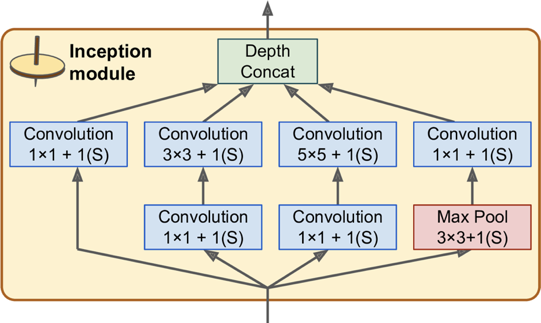

## ResNet

#### > MS, ImageNet 2015

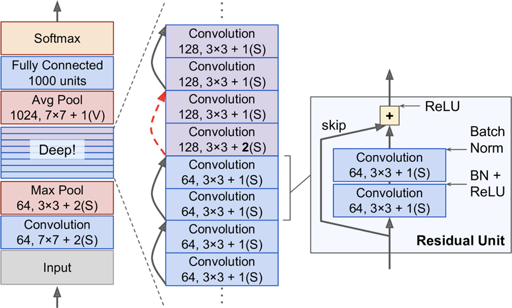

### TextCNN

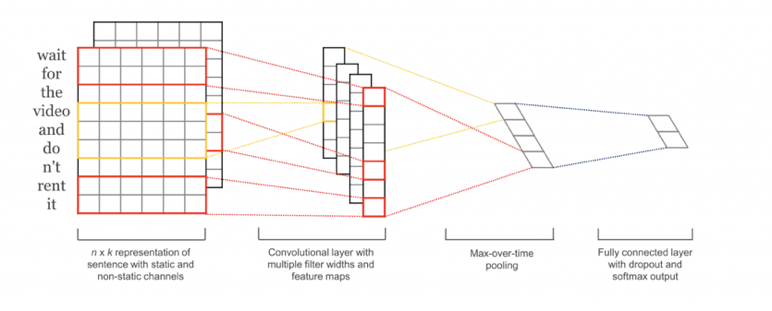

## Transfer Learning

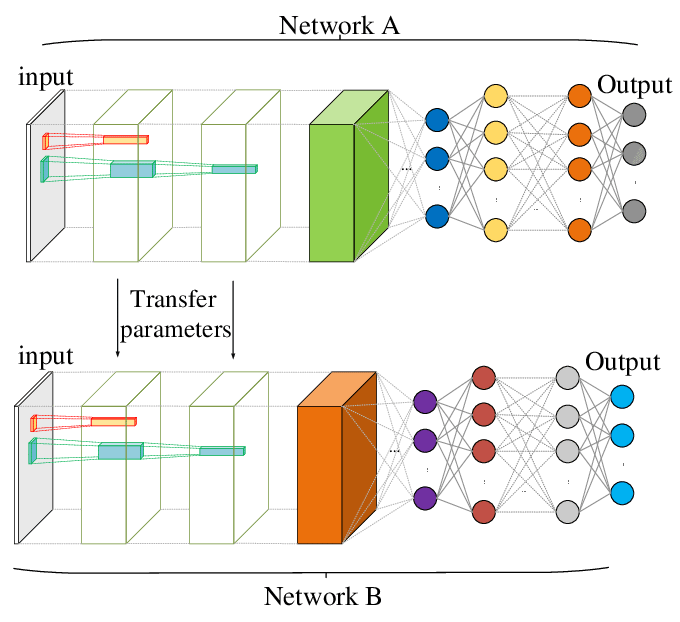

### Pytroch Transfer Example 

```python

```

In [138]:
res_net = torchvision.models.resnet18(pretrained=True)

In [139]:
unknow = Image.open('dataset/unknow.jpeg')

In [140]:
from torchvision import transforms

In [141]:
preprocess = transforms.Compose([
        transforms.Resize(224),
        transforms.CenterCrop(224),
        transforms.ToTensor(),
#        transforms.Normalize(
#           mean=[0.485, 0.456, 0.406],
#           std=[0.229, 0.224, 0.225]
#           )
])

In [142]:
img_t = preprocess(unknow)

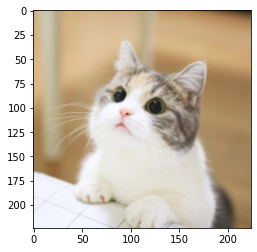

In [143]:
plt.imshow(img_t.permute(1,2, 0))

## CIFAR-10 resize to ResNet input 

In [144]:
cifar_10 = torchvision.datasets.CIFAR10('.', download=True, transform=preprocess)

Files already downloaded and verified


In [145]:
train_loader = torch.utils.data.DataLoader(cifar_10,
                                          batch_size=512,
                                          shuffle=True)

In [146]:
cifar_10[0][0].shape

torch.Size([3, 224, 224])

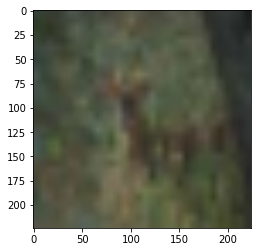

In [147]:
plt.imshow(cifar_10[10][0].permute(1, 2, 0))

In [148]:
import torch.nn.functional as F

In [149]:
for param in res_net.parameters():
    param.requires_grad = False

# Parameters of newly constructed modules have requires_grad=True by default
num_ftrs = res_net.fc.in_features

res_net.fc = nn.Linear(num_ftrs, 10) # only update this part parameters 

criterion = nn.CrossEntropyLoss()

# Observe that only parameters of final layer are being optimized as
# opposed to before.
optimizer_conv = optim.SGD(res_net.fc.parameters(), lr=0.001, momentum=0.9)

# Decay LR by a factor of 0.1 every 7 epochs

In [ ]:
losses = []

epochs = 10

for epoch in range(epochs):
    loss_train = 0
    for i, (imgs, labels) in enumerate(train_loader):        
        print(i)
        outputs = res_net(imgs)
        
        loss = criterion(outputs, labels)
        
        optimizer_conv.zero_grad()
        
        loss.backward()
        
        optimizer_conv.step()
        
        loss_train += loss.item()
        
        if i > 0 and i % 10 == 0:
            print('Epoch: {}, batch: {}'.format(epoch, i))
            print('-- loss: {}'.format(loss_train / i))
            
    losses.append(loss_train / len(train_loader))

0
1
2
3
4
5
6
7
8
9
10
Epoch: 0, batch: 10
-- loss: 2.684867572784424
11
12
13
14
